# Data Science Project - Analysis of Airbnb Data

42577 Introduction to Business Analytics course - Group 13

Students: Andreas Ipsen (s174021) | Andro Kranjcevic (s204704) | Smári Steinn Ársælsson (s222554) | Bjarki Rúnar Sverrisson (s222547)

## Table of Contents
* [1.Data preparation and descriptive statistics](#chapter1)
    * [1.1 Columns with review values ](#section_1_1)
    * [1.2 Coulmns with price values](#section_1_1)
    * [1.3 columns with geographical values](#section_1_1)
    * [Section 1.4](#section_1_1)
        * [Sub Section 1.1.1](#sub_section_1_1_1)
* [2.Prediction challenge](#chapter2)
    * [Binary classification](#section_2_1)
        * [Sub Section 2.1.1](#sub_section_2_1_1)
    * [Multi class classification](#section_2_2)
        * [Sub Section 2.2.1](#sub_section_2_2_1)
* [3.Exploratory component](#chapter3)
    * [Section 3.1](#section_3_1)
        * [Sub Section 3.1.1](#sub_section_3_1_1)
    * [Section 3.2](#section_3_2)
        * [Sub Section 3.2.1](#sub_section_3_2_1)

After moving to San Francisco in October 2007, roommates Brian Chesky and Joe Gebbia decided to turn their living room into accommodation and discovered a business opportunity. Shortly after, a web platform where users can rent out their place to host travelers was established, today known as Airbnb. The project will focus on data analysis of rental pricing, geographical factors, and feedback values on Airbnb for various periods of stay, to assist both, renters, and tenants with decision-making, and therefore, creating value for both sides. Our findings should help customers select reliable, and affordable listing for their stay, and support the renters in their actions for increasing their profit.

The first part of the notebook is about cleaning and preparing the dataset for further analysis and descriptive statistics, and
to get a greater overview of the data. Dataset will be cleaned further by not considering outliers, and columns consisting of wrong, or NaN values. The dataset will be prepared further by independently performing an analysis of features, corresponding to their review, price, and geographical values.



# 1. Data preperation and descriptive statistics

Imorting the dataset and packages that will be used.

In [1394]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
%matplotlib inline

In [1395]:
data=pd.read_csv("listings_CPH.csv")

In [1396]:
data.head()   #display first 5 rows

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,6983,Copenhagen 'N Livin',16774,Simon,NaN,Nrrebro,55.686410,12.547410,Entire home/apt,898,3,172,2022-06-21,1.08,1,0,4,NaN
1,26057,Lovely house - most attractive area,109777,Kari,NaN,Indre By,55.693070,12.576490,Entire home/apt,2600,4,59,2022-08-09,0.55,1,303,8,NaN
2,26473,City Centre Townhouse Sleeps 1-10 persons,112210,Julia,NaN,Indre By,55.676020,12.575400,Entire home/apt,3250,3,300,2022-09-10,2.06,3,56,7,NaN
3,29118,Best Location in Cool Istedgade,125230,Nana,NaN,Vesterbro-Kongens Enghave,55.670230,12.555040,Entire home/apt,725,7,24,2022-08-04,0.16,1,59,2,NaN
4,31094,"Beautiful, spacious, central, renovated Penthouse",129976,Ebbe,NaN,Vesterbro-Kongens Enghave,55.666602,12.555283,Entire home/apt,1954,3,19,2022-08-22,0.13,1,0,2,NaN


We can start by simply checking the length and shape of the dataset.

In [1397]:
data.shape

(13815, 18)

It is important to have an overview of which data types the dataset consists of.

In [1398]:
data.dtypes

id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group               float64
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
number_of_reviews_ltm               int64
license                           float64
dtype: object

It is visible that 'last_review' is an object, and not datetime object. Therefore, pandas to_datetime function is used to parse the column as DateTime.

In [1399]:
data['last_review']=pd.to_datetime(data['last_review'],format='%Y-%m-%d')
data.dtypes 

id                                         int64
name                                      object
host_id                                    int64
host_name                                 object
neighbourhood_group                      float64
neighbourhood                             object
latitude                                 float64
longitude                                float64
room_type                                 object
price                                      int64
minimum_nights                             int64
number_of_reviews                          int64
last_review                       datetime64[ns]
reviews_per_month                        float64
calculated_host_listings_count             int64
availability_365                           int64
number_of_reviews_ltm                      int64
license                                  float64
dtype: object

We should also investigate the description of the numerical data.

In [1400]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
id,13815.0,1.719385e+17,2.852538e+17,6983.00000,1.907962e+07,3.931542e+07,5.665348e+17,7.222925e+17
host_id,13815.0,1.064145e+08,1.302801e+08,11718.00000,1.356383e+07,4.656301e+07,1.553486e+08,4.805803e+08
neighbourhood_group,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
latitude,13815.0,5.568057e+01,2.108847e-02,55.60951,5.566611e+01,5.568119e+01,5.569577e+01,5.574280e+01
longitude,13815.0,1.255781e+01,3.351154e-02,12.43567,1.254029e+01,1.255552e+01,1.258074e+01,1.265174e+01
price,13815.0,1.205879e+03,1.433143e+03,0.00000,7.290000e+02,9.950000e+02,1.368500e+03,6.490000e+04
minimum_nights,13815.0,4.605574e+00,1.690015e+01,1.00000,2.000000e+00,3.000000e+00,4.000000e+00,1.111000e+03
number_of_reviews,13815.0,1.857112e+01,3.640267e+01,0.00000,2.000000e+00,7.000000e+00,2.000000e+01,7.110000e+02
reviews_per_month,12170.0,9.038159e-01,1.110754e+00,0.01000,2.300000e-01,5.300000e-01,1.120000e+00,2.402000e+01
calculated_host_listings_count,13815.0,4.400651e+00,2.129857e+01,1.00000,1.000000e+00,1.000000e+00,1.000000e+00,1.790000e+02


When comparing the mean to the median values across the different classes, it is visible that there is mostly a significant difference between them. It implies that we have a high amount of outliers, to which we should pay attention, in further analysis.

By looking at both, numeric and, object series in DataFrame above, it was noticed that the columns ('license'), and ('neighbourhood_group') had count=0, meaning that they only consist of NaN values. They don't bring any value for further analysis, and therefore, both of the columns will be dropped. On top of that, columns that are identified not to bring any significant value will also be dropped.


In [1401]:
data=data.drop(columns=['neighbourhood_group','license','id','host_id','host_name','name'])    #drop non-desired columns
data

,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,Nrrebro,55.686410,12.547410,Entire home/apt,898,3,172,2022-06-21,1.08,1,0,4
1,Indre By,55.693070,12.576490,Entire home/apt,2600,4,59,2022-08-09,0.55,1,303,8
2,Indre By,55.676020,12.575400,Entire home/apt,3250,3,300,2022-09-10,2.06,3,56,7
3,Vesterbro-Kongens Enghave,55.670230,12.555040,Entire home/apt,725,7,24,2022-08-04,0.16,1,59,2
4,Vesterbro-Kongens Enghave,55.666602,12.555283,Entire home/apt,1954,3,19,2022-08-22,0.13,1,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...
13810,sterbro,55.732840,12.572370,Entire home/apt,1250,14,0,NaT,NaN,1,0,0
13811,Valby,55.667782,12.463285,Entire home/apt,450,3,3,2022-07-21,1.01,1,0,3
13812,Valby,55.659536,12.474726,Entire home/apt,400,1,3,2022-08-14,1.27,1,0,3
13813,Brnshj-Husum,55.730971,12.487993,Entire home/apt,850,1,0,NaT,NaN,1,0,0


The rows which have value of 0 for the availability column will be ignored, as they do not bring any value to the renter, or the future tenants. 

In [1402]:
#show data where availability_365 is 0
data[data['availability_365']==0]


,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,Nrrebro,55.686410,12.547410,Entire home/apt,898,3,172,2022-06-21,1.08,1,0,4
4,Vesterbro-Kongens Enghave,55.666602,12.555283,Entire home/apt,1954,3,19,2022-08-22,0.13,1,0,2
8,Indre By,55.685470,12.565430,Entire home/apt,2916,5,11,2017-08-22,0.07,1,0,0
12,Frederiksberg,55.684930,12.534340,Private room,465,3,57,2022-05-30,0.40,1,0,9
17,Indre By,55.683130,12.562250,Entire home/apt,1406,2,50,2022-08-21,0.36,1,0,7
...,...,...,...,...,...,...,...,...,...,...,...,...
13810,sterbro,55.732840,12.572370,Entire home/apt,1250,14,0,NaT,NaN,1,0,0
13811,Valby,55.667782,12.463285,Entire home/apt,450,3,3,2022-07-21,1.01,1,0,3
13812,Valby,55.659536,12.474726,Entire home/apt,400,1,3,2022-08-14,1.27,1,0,3
13813,Brnshj-Husum,55.730971,12.487993,Entire home/apt,850,1,0,NaT,NaN,1,0,0


In [1403]:
#remove data with avalability as 0
data=data[data['availability_365']!=0]   #drop rows containing 0 in the 'availability_365' column


# 1.1 Columns with review values

The selected columns are containing review values, describing the amount, monthly occurrence, and date of the reviews. The rows with NaN values will be dropped, as it is known that they won't provide any information regarding the review status, and will not be taken into consideration in this section. The aim here is to sort the data in a way, that contains only the properties with feedback (review), and with the most recent reviews (<1 year), which are not outdated. And on top of that, to check whether data from the review columns are highly correlated with other aspects of the dataset (eg. price).

In [1404]:
#data_review=data.dropna(subset=['number_of_reviews','last_review','reviews_per_month','number_of_reviews_ltm'])  #drop NaN in selected columns
#there are no nan values in thease columns if avalability = 0 is removed
#i also dont think we should remove thease since having no reviews can just mean they are new or have not had many guests
# set all data with nan values to 0 in review columns
data['number_of_reviews']=data['number_of_reviews'].fillna(0)
data['reviews_per_month']=data['reviews_per_month'].fillna(0)
data['last_review']=data['last_review'].fillna(0)

/var/folders/_s/wxt2wlzx00qdfwbsx6fdl1200000gn/T/ipykernel_7174/4279721522.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['number_of_reviews']=data['number_of_reviews'].fillna(0)
/var/folders/_s/wxt2wlzx00qdfwbsx6fdl1200000gn/T/ipykernel_7174/4279721522.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['reviews_per_month']=data['reviews_per_month'].fillna(0)
/var/folders/_s/wxt2wlzx00qdfwbsx6fdl1200000gn/T/ipykernel_7174/4279721522.py:7: SettingWithCopyWarning: 
A value is trying to be set 

In [1405]:
data.shape

(8969, 12)

In [1406]:
data_review.head()

,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,Nrrebro,55.686410,12.547410,Entire home/apt,898,3,172,2022-06-21 00:00:00,1.08,1,0,4
1,Indre By,55.693070,12.576490,Entire home/apt,2600,4,59,2022-08-09 00:00:00,0.55,1,303,8
2,Indre By,55.676020,12.575400,Entire home/apt,3250,3,300,2022-09-10 00:00:00,2.06,3,56,7
3,Vesterbro-Kongens Enghave,55.670230,12.555040,Entire home/apt,725,7,24,2022-08-04 00:00:00,0.16,1,59,2
4,Vesterbro-Kongens Enghave,55.666602,12.555283,Entire home/apt,1954,3,19,2022-08-22 00:00:00,0.13,1,0,2


To have a better overview of the columns containing review values, they will be sorted in a smaller version of our dataframe. 

In [1407]:
ae=data_review[['number_of_reviews', 'last_review', 'reviews_per_month', 'number_of_reviews_ltm']]
ae

,number_of_reviews,last_review,reviews_per_month,number_of_reviews_ltm
0,172,2022-06-21 00:00:00,1.08,4
1,59,2022-08-09 00:00:00,0.55,8
2,300,2022-09-10 00:00:00,2.06,7
3,24,2022-08-04 00:00:00,0.16,2
4,19,2022-08-22 00:00:00,0.13,2
...,...,...,...,...
13810,0,0,0.00,0
13811,3,2022-07-21 00:00:00,1.01,3
13812,3,2022-08-14 00:00:00,1.27,3
13813,0,0,0.00,0


The next step is to visualize the relevant columns with  review values, for the outliers detection, and further investigation.

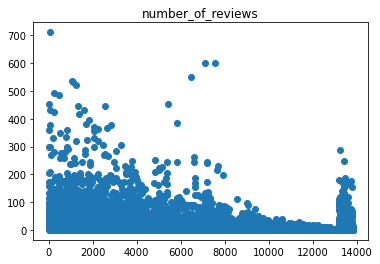

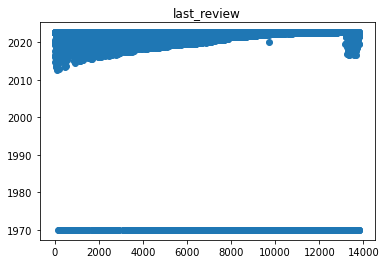

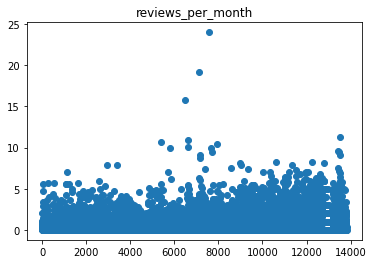

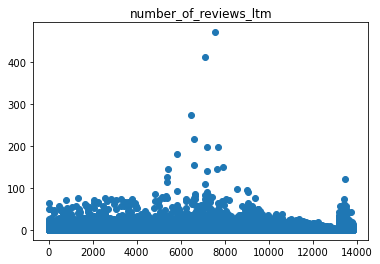

In [1408]:
data_col=['number_of_reviews', 'last_review', 'reviews_per_month','number_of_reviews_ltm']
for i in range(len(data_col)):
    plt.scatter(range(0,len(data_review[data_col[i]])),data_review[data_col[i]])
    plt.title(data_col[i])
    plt.show()

As expected, all the plots above have similar distribution, and outlier position. The plot we're most interested in is 'number_of _reviews_ltm', as it does not contain outdated reviews.  


In [1409]:
#maybe explain, based on the graphs how correlated they are

In this case, outliers will be considered the points with value higher than 150. 

In [1410]:
data_review.loc[data_review["number_of_reviews_ltm"] > 150]   #display only the rows with more than 500 reviews

,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
5810,Indre By,55.68185,12.57592,Entire home/apt,3031,1,383,2022-09-21 00:00:00,9.99,4,365,182
6476,Bispebjerg,55.70322,12.53800,Shared room,198,1,550,2022-09-09 00:00:00,15.74,1,364,275
6618,Vesterbro-Kongens Enghave,55.67091,12.56357,Entire home/apt,1461,1,246,2022-09-14 00:00:00,10.03,3,349,154
6619,Vesterbro-Kongens Enghave,55.67091,12.56357,Entire home/apt,2099,1,263,2022-09-18 00:00:00,10.90,3,358,216
7099,Indre By,55.68213,12.57523,Entire home/apt,1529,1,602,2022-09-22 00:00:00,19.23,6,364,411
7181,Amager st,55.66522,12.61890,Private room,662,1,246,2022-09-20 00:00:00,8.71,1,365,198
7570,Vesterbro-Kongens Enghave,55.67167,12.54656,Private room,721,1,599,2022-09-07 00:00:00,24.02,3,362,471
7690,Vesterbro-Kongens Enghave,55.67188,12.55802,Shared room,411,1,230,2022-09-20 00:00:00,9.48,1,297,197


It is visible from the plot above that all the stayings considered as an outliers were of very short duration ('minimum_nights'==1). Because of that, much more customers went through the property, and therefore amount of provided reviews was significantly higher compared to the rest of the stayings. However, it this situation, the properties considered as outliers can rely more on the customer feedback than others.




# 1.2 Columns with price values

In [1411]:
data.T

,1,2,3,5,6,7,9,10,11,13,...,13767,13768,13769,13770,13778,13780,13782,13786,13790,13795
neighbourhood,Indre By,Indre By,Vesterbro-Kongens Enghave,Vesterbro-Kongens Enghave,sterbro,Vesterbro-Kongens Enghave,Indre By,Amager Vest,Frederiksberg,Frederiksberg,...,Bispebjerg,sterbro,Valby,Valby,Brnshj-Husum,Brnshj-Husum,Amager st,sterbro,Bispebjerg,sterbro
latitude,55.69307,55.67602,55.67023,55.672638,55.71176,55.66631,55.684288,55.66507,55.68127,55.67806,...,55.73929,55.73737,55.66667,55.64012,55.72046,55.72294,55.6394,55.73471,55.7214,55.73352
longitude,12.57649,12.5754,12.55504,12.552493,12.57091,12.54555,12.573019,12.58315,12.55389,12.55044,...,12.53579,12.550755,12.47507,12.47752,12.44334,12.44623,12.64314,12.56279,12.51204,12.5792
room_type,Entire home/apt,Entire home/apt,Entire home/apt,Entire home/apt,Entire home/apt,Entire home/apt,Entire home/apt,Entire home/apt,Entire home/apt,Entire home/apt,...,Entire home/apt,Entire home/apt,Entire home/apt,Entire home/apt,Entire home/apt,Entire home/apt,Entire home/apt,Entire home/apt,Entire home/apt,Entire home/apt
price,2600,3250,725,1280,617,1000,1900,2000,535,2302,...,600,3000,1200,847,300,650,989,1050,1000,429
minimum_nights,4,3,7,3,100,6,14,2,35,2,...,3,3,1,2,4,1,4,2,5,14
number_of_reviews,59,300,24,80,7,71,15,94,79,10,...,2,1,8,29,18,29,20,6,4,9
last_review,2022-08-09 00:00:00,2022-09-10 00:00:00,2022-08-04 00:00:00,2022-08-13 00:00:00,2016-09-15 00:00:00,2019-03-14 00:00:00,2022-09-17 00:00:00,2022-09-04 00:00:00,2022-08-28 00:00:00,2022-08-10 00:00:00,...,2022-05-16 00:00:00,2022-08-06 00:00:00,2022-06-23 00:00:00,2022-09-04 00:00:00,2022-08-04 00:00:00,2022-07-18 00:00:00,2022-09-10 00:00:00,2021-07-10 00:00:00,2022-08-08 00:00:00,2022-09-17 00:00:00
reviews_per_month,0.55,2.06,0.16,0.54,0.05,0.48,0.1,0.64,0.55,0.09,...,0.06,0.6,0.34,0.39,0.24,0.55,0.44,0.16,0.12,0.64
calculated_host_listings_count,1,3,1,2,1,1,1,1,1,1,...,2,1,1,1,1,1,3,1,1,4


In [1412]:
price_median = np.median(data["price"])
print(price_median)

1004.0


Graphs

<AxesSubplot:xlabel='neighbourhood'>

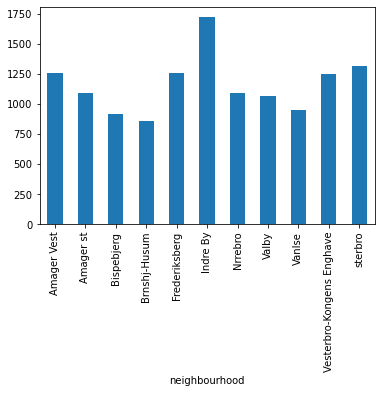

In [1413]:
data.groupby("neighbourhood")["price"].mean().plot(kind="bar")

<AxesSubplot:xlabel='neighbourhood'>

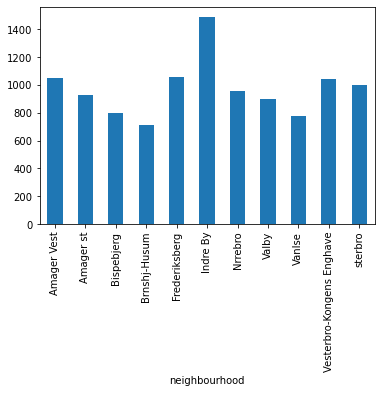

In [1414]:
data.groupby("neighbourhood")["price"].median().plot(kind="bar")

<AxesSubplot:xlabel='room_type'>

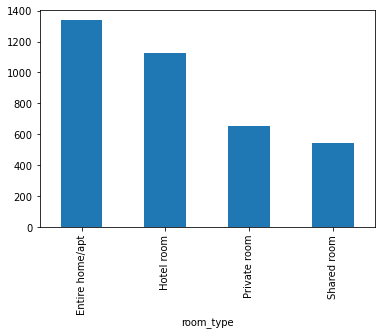

In [1415]:
data.groupby("room_type")["price"].mean().plot(kind="bar")

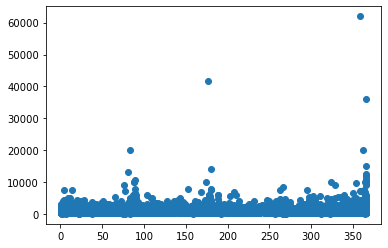

In [1416]:
plt.scatter(data.availability_365,data.price)

In [1417]:
plt.scatter(data.availability_365,data.price)

Error in callback <function flush_figures at 0x7f8db0bc9940> (for post_execute):


KeyboardInterrupt: 

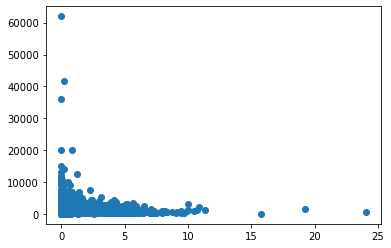

In [ ]:
plt.scatter(data.reviews_per_month,data.price)

So we have 6 outliers that have way higher price than the rest. Lest try to take them out and plot these same 3 graphs again

In [ ]:
dataset = data[data["price"]<30000]

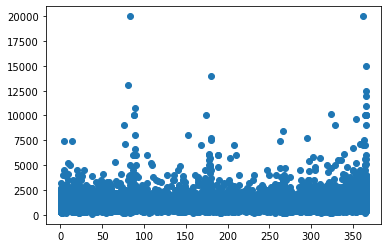

In [ ]:
plt.scatter(dataset.availability_365,dataset.price)

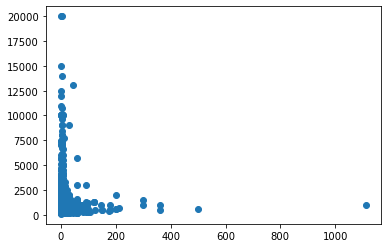

In [ ]:
plt.scatter(dataset.minimum_nights,dataset.price)

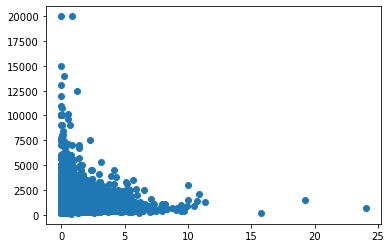

In [ ]:
plt.scatter(dataset.reviews_per_month,dataset.price)

# 1.3 Columns with geographical values

In [ ]:
#Find number of neighboorhoods in list
num_neighbourhoods=len(set(data.neighbourhood))-1 # Why -1?
print(num_neighbourhoods)

10


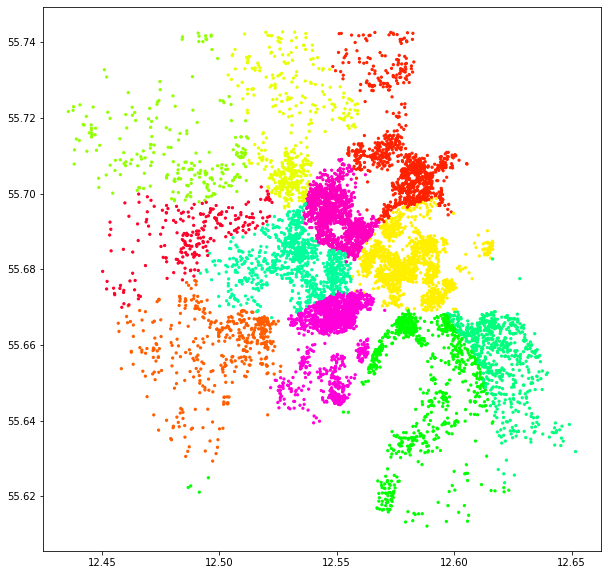

In [ ]:
colors = [float(hash(s) % 256) / 256 for s in data.neighbourhood]      

plt.figure(figsize=(10,10))
plt.scatter(data.longitude,data.latitude, s=5,c=colors,cmap="gist_rainbow",label=data.neighbourhood)
plt.show()


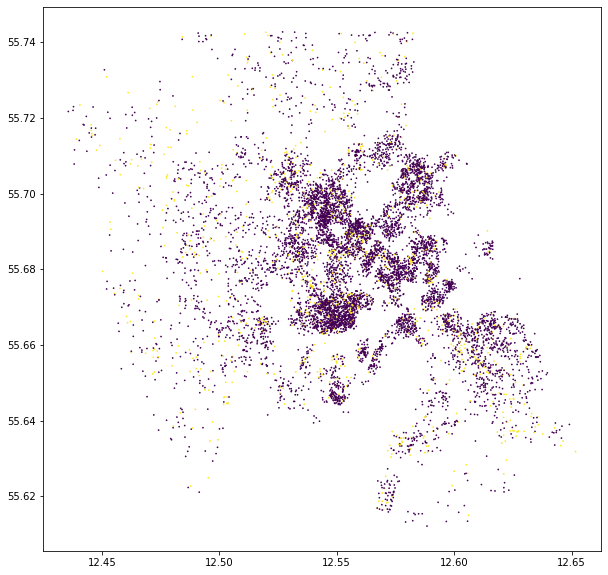

In [ ]:
colors = [float(hash(s) % 4) / 4  for s in data.room_type]      

plt.figure(figsize=(10,10))
plt.scatter(data.longitude,data.latitude, s=0.5,c=colors)
plt.show()

In [ ]:
import geopandas as gpd
import urllib

url = "https://kkkortdata.spatialsuite.dk/airview/CAV_25May2021.geojson"
remote_data = urllib.request.urlopen(url)
map_data = gpd.read_file(remote_data)
map_data.head()

,FID,Shape_Leng,ROAD_FID,Mixed_NO2,Mixed_UFP,Mixed_BC,geometry
0,0,58.821698,1,-999999,-999999,-999999.0,"LINESTRING (12.57828 55.69392, 12.57752 55.69423)"
1,1,31.898519,2,10,18500,0.8,"LINESTRING (12.62463 55.63461, 12.62473 55.63433)"
2,2,36.276259,3,9,12800,0.8,"LINESTRING (12.58604 55.60184, 12.58595 55.602..."
3,3,40.416066,4,9,10700,0.7,"LINESTRING (12.58629 55.59317, 12.58569 55.59305)"
4,4,32.734397,5,13,14500,1.1,"LINESTRING (12.58135 55.59200, 12.58130 55.59171)"


<Figure size 1080x1080 with 0 Axes>

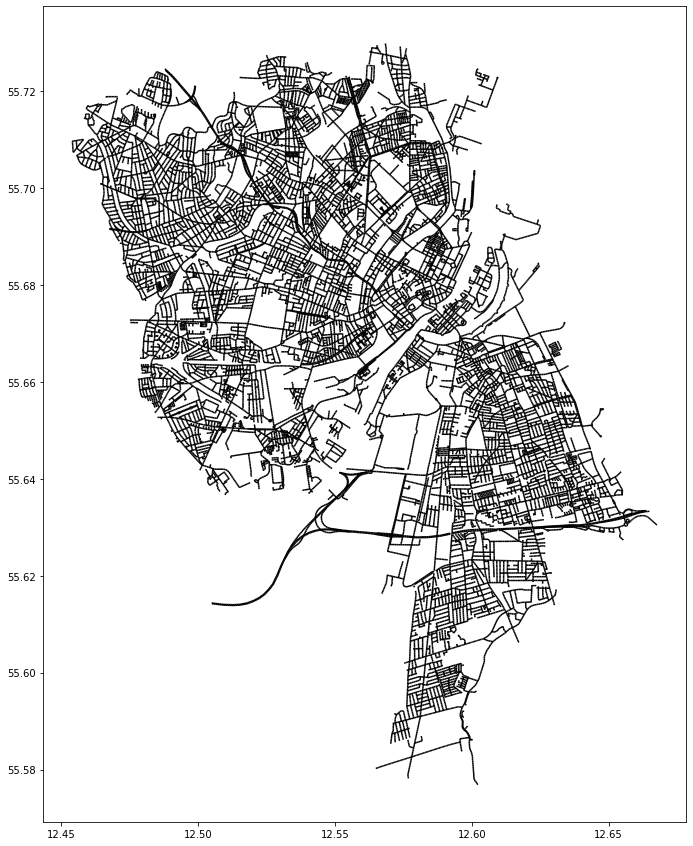

In [ ]:
map_data.Mixed_BC=0
plt.figure(figsize=(15,15))
map_data.plot(column="Mixed_BC", cmap="gray",figsize=(15,15))
plt.show()


Exception ignored in: <function BaseGeometry.__del__ at 0x7f8d9ac16b80>
Traceback (most recent call last):
  File "/Users/smaristeinn/opt/anaconda3/lib/python3.9/site-packages/shapely/geometry/base.py", line 209, in __del__
    self._empty(val=None)
  File "/Users/smaristeinn/opt/anaconda3/lib/python3.9/site-packages/shapely/geometry/base.py", line 199, in _empty
    self._is_empty = True
  File "/Users/smaristeinn/opt/anaconda3/lib/python3.9/site-packages/shapely/geometry/base.py", line 248, in __setattr__
    try:
KeyboardInterrupt: 


<Figure size 1080x1080 with 0 Axes>

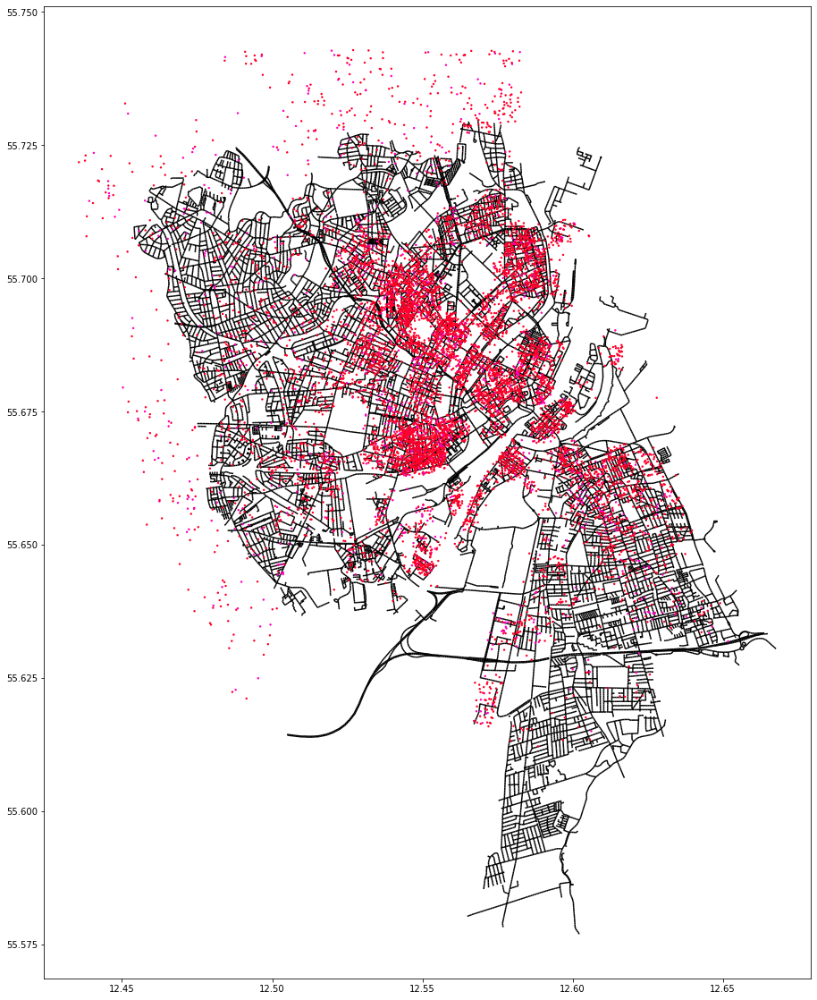

In [ ]:

plt.figure(figsize=(15,15))

# set aspect to equal. This is done automatically
# when using *geopandas* plot on it's own, but not when
# working with pyplot directly.

map_data.plot(column="Mixed_BC",zorder=0,cmap="gray",figsize=(20,20))
plt.scatter(data.longitude,data.latitude, s=2,c=colors,cmap="gist_rainbow",zorder=10)

plt.show();


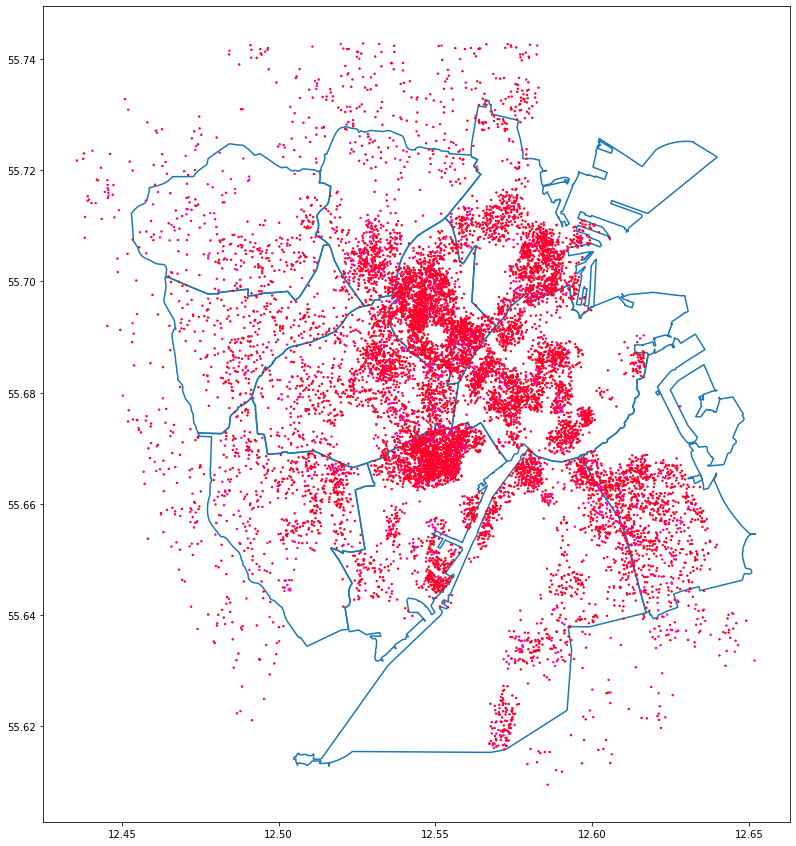

In [ ]:

theHoods=gpd.read_file('neighbourhoods.geojson')
theHoods.boundary.plot(figsize=(15,15))
plt.scatter(data.longitude,data.latitude, s=2,c=colors,cmap="gist_rainbow",zorder=10)



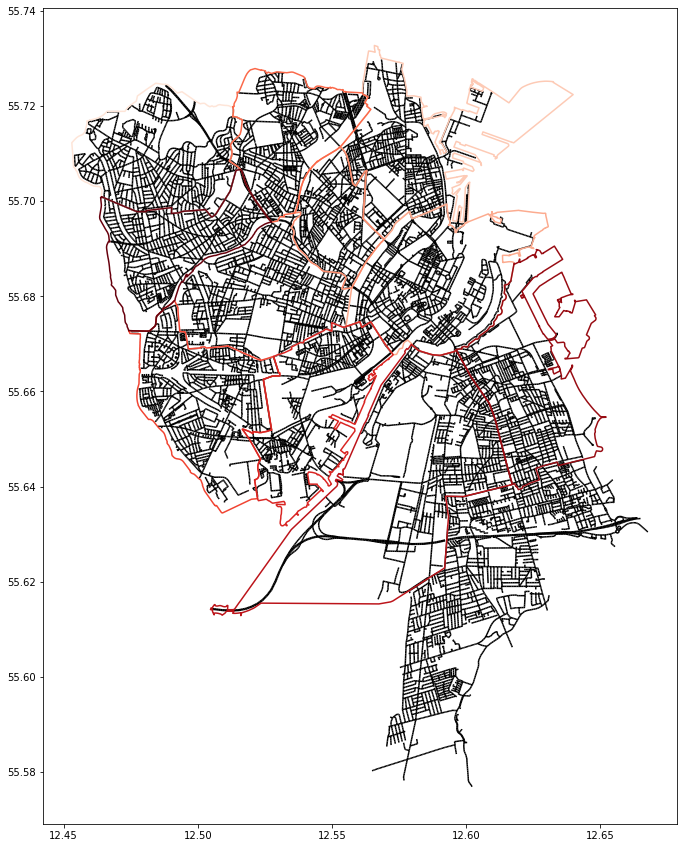

In [ ]:
fig, ax = plt.subplots(figsize=(15,15))
ax.set_aspect('equal')

theHoods.boundary.plot(ax=ax,zorder=1,figsize=(15,15),cmap='Reds')
map_data.plot(ax=ax,column="Mixed_BC",zorder=0,cmap="gray")


plt.show();

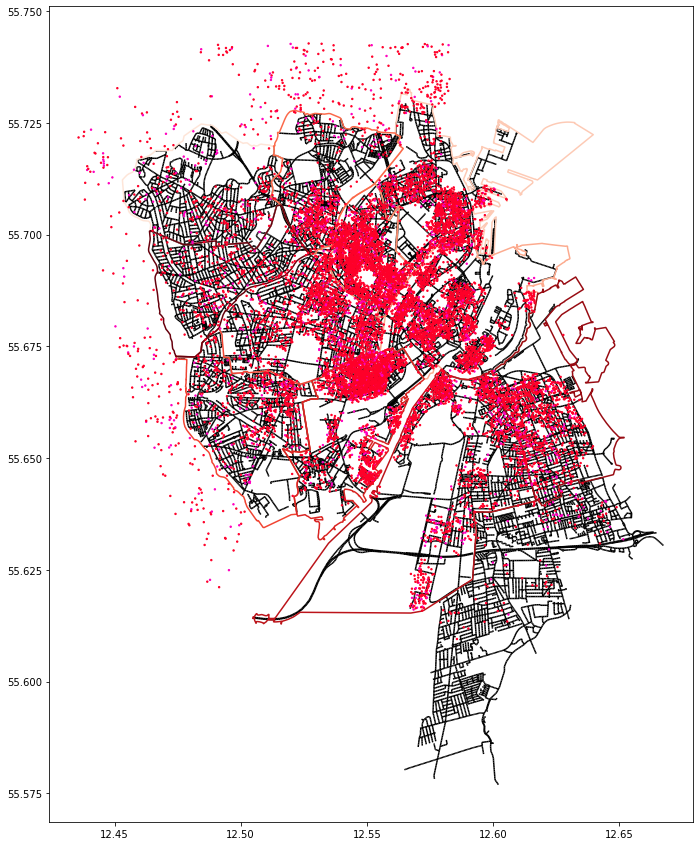

In [ ]:
fig, ax = plt.subplots(figsize=(15,15)) #Has to be treated as a subplot. See geopandas documentation
ax.set_aspect('equal')

theHoods.boundary.plot(ax=ax,zorder=1,figsize=(15,15),cmap='Reds')
map_data.plot(ax=ax,column="Mixed_BC",zorder=0,cmap="gray")
plt.scatter(data.longitude,data.latitude, s=2,c=colors,cmap="gist_rainbow",zorder=10)


plt.show();

In [ ]:
#Find number of neighboorhoods in list
num_neighbourhoods=len(set(data.neighbourhood))-1 # Why -1?
print(num_neighbourhoods)

10


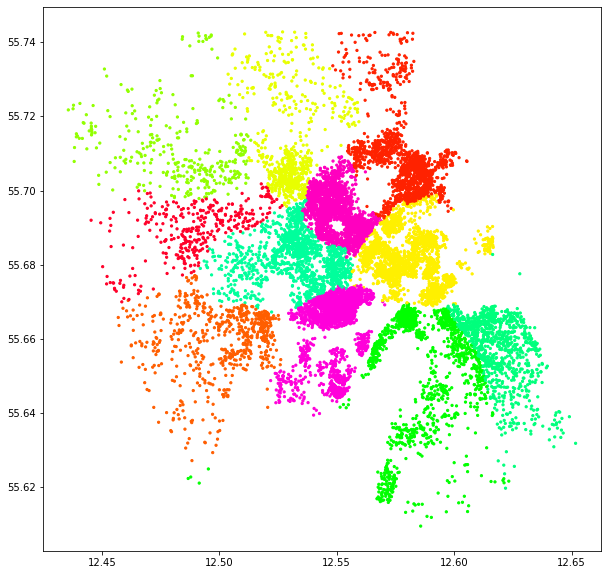

In [ ]:
colors = [float(hash(s) % 256) / 256 for s in data.neighbourhood]      

plt.figure(figsize=(10,10))
plt.scatter(data.longitude,data.latitude, s=5,c=colors,cmap="gist_rainbow",label=data.neighbourhood)
plt.show()


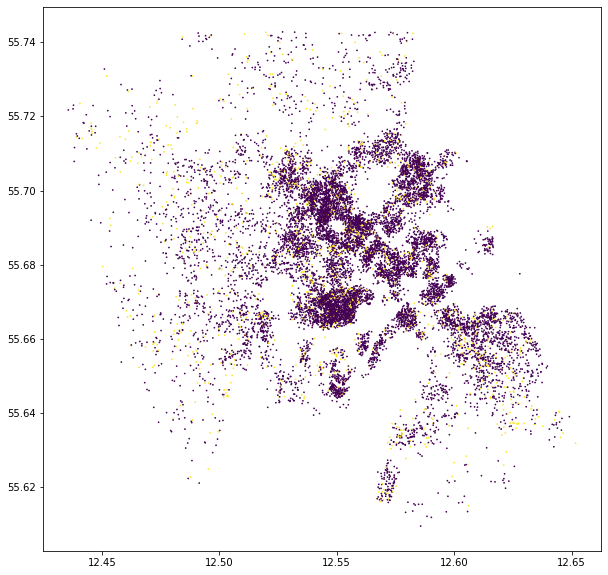

In [ ]:
colors = [float(hash(s) % 4) / 4  for s in data.room_type]      

plt.figure(figsize=(10,10))
plt.scatter(data.longitude,data.latitude, s=0.5,c=colors)
plt.show()

In [ ]:
import geopandas as gpd
import urllib

url = "https://kkkortdata.spatialsuite.dk/airview/CAV_25May2021.geojson"
remote_data = urllib.request.urlopen(url)
map_data = gpd.read_file(remote_data)
map_data.head()

,FID,Shape_Leng,ROAD_FID,Mixed_NO2,Mixed_UFP,Mixed_BC,geometry
0,0,58.821698,1,-999999,-999999,-999999.0,"LINESTRING (12.57828 55.69392, 12.57752 55.69423)"
1,1,31.898519,2,10,18500,0.8,"LINESTRING (12.62463 55.63461, 12.62473 55.63433)"
2,2,36.276259,3,9,12800,0.8,"LINESTRING (12.58604 55.60184, 12.58595 55.602..."
3,3,40.416066,4,9,10700,0.7,"LINESTRING (12.58629 55.59317, 12.58569 55.59305)"
4,4,32.734397,5,13,14500,1.1,"LINESTRING (12.58135 55.59200, 12.58130 55.59171)"


<Figure size 1080x1080 with 0 Axes>

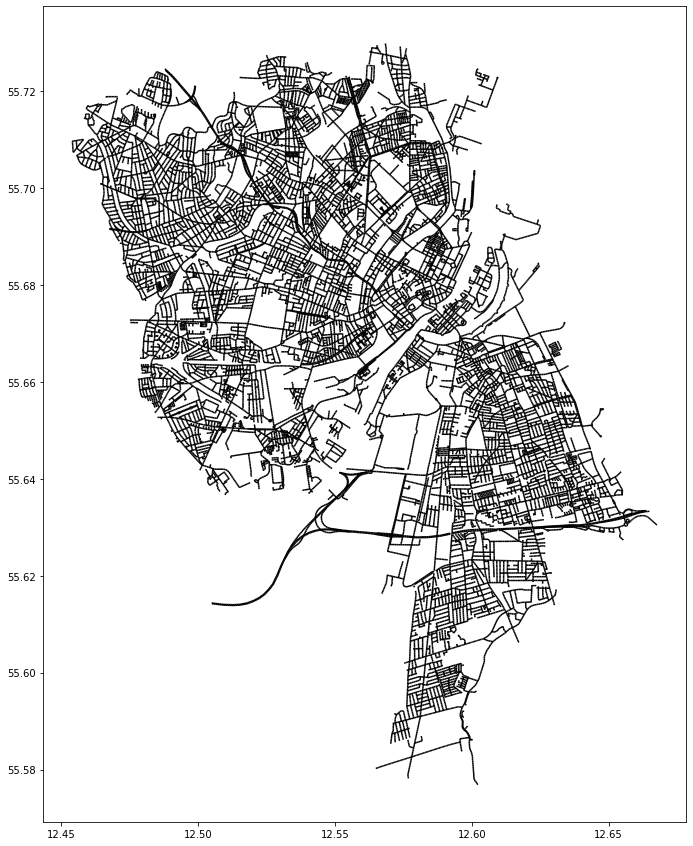

In [ ]:
map_data.Mixed_BC=0
plt.figure(figsize=(15,15))
map_data.plot(column="Mixed_BC", cmap="gray",figsize=(15,15))
plt.show()


<Figure size 1080x1080 with 0 Axes>

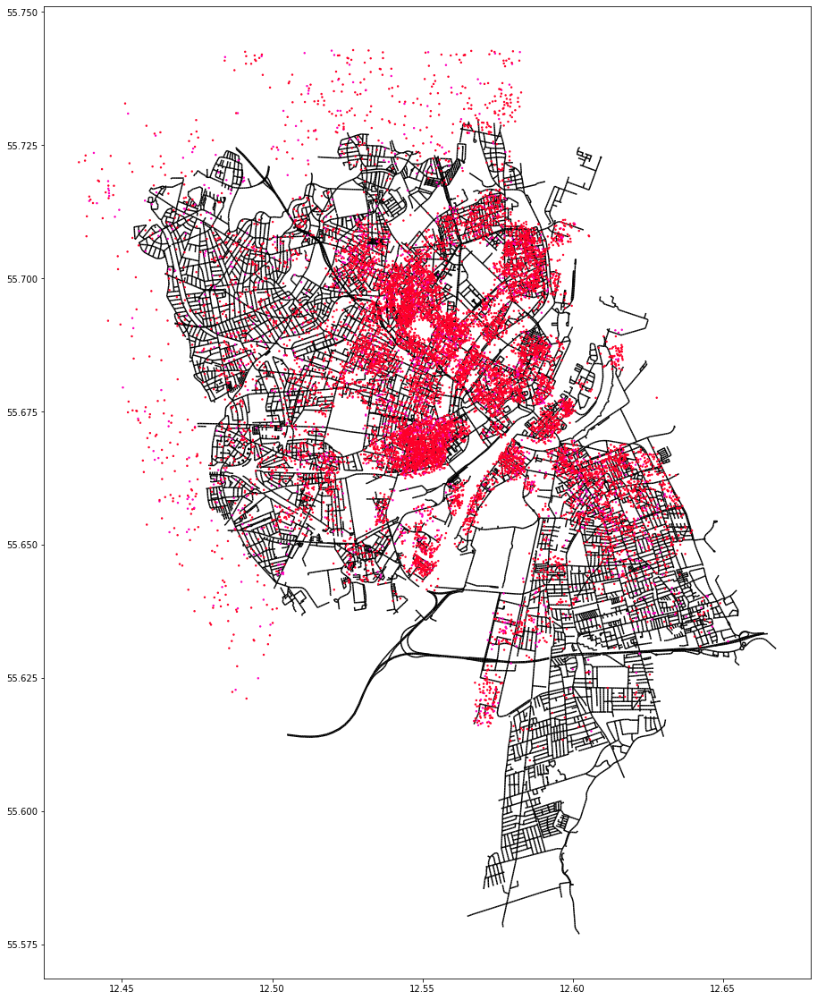

In [ ]:
plt.figure(figsize=(15,15))

# set aspect to equal. This is done automatically
# when using *geopandas* plot on it's own, but not when
# working with pyplot directly.

map_data.plot(column="Mixed_BC",zorder=0,cmap="gray",figsize=(20,20))
plt.scatter(data.longitude,data.latitude, s=2,c=colors,cmap="gist_rainbow",zorder=10)

plt.show();

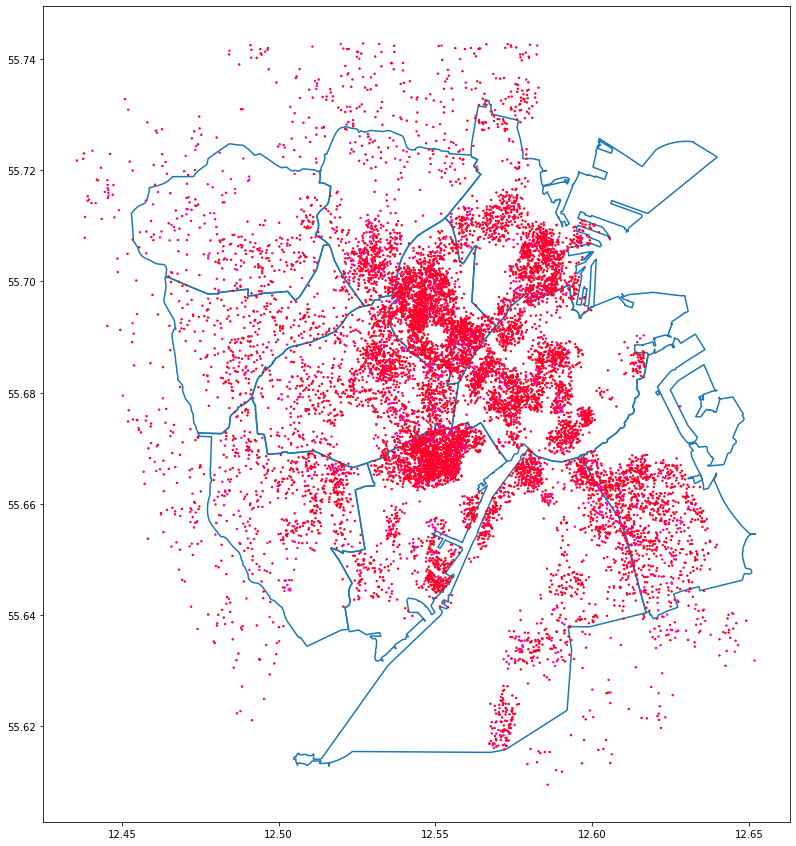

In [ ]:
theHoods=gpd.read_file('neighbourhoods.geojson')
theHoods.boundary.plot(figsize=(15,15))
plt.scatter(data.longitude,data.latitude, s=2,c=colors,cmap="gist_rainbow",zorder=10)


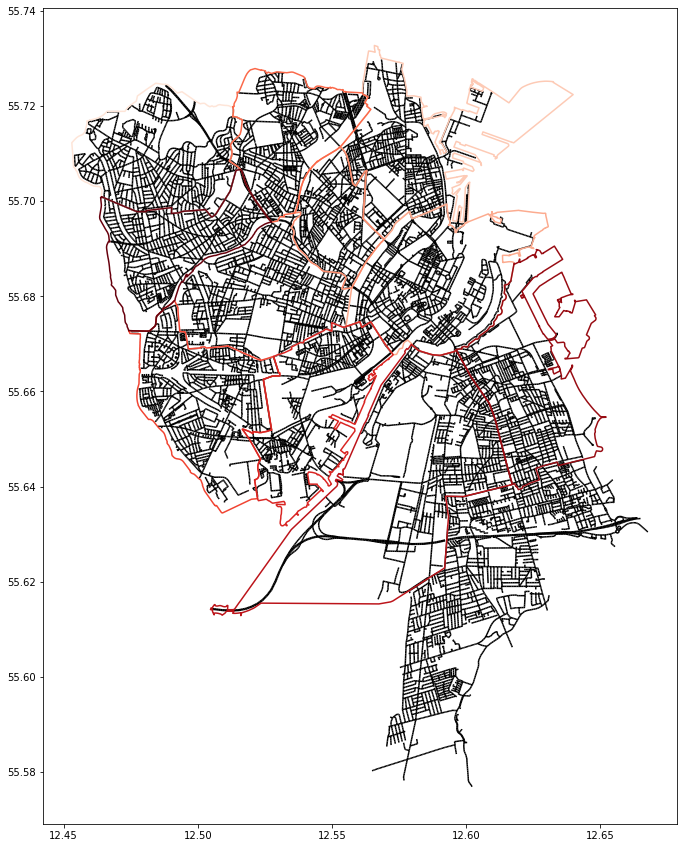

In [ ]:
fig, ax = plt.subplots(figsize=(15,15))
ax.set_aspect('equal')

theHoods.boundary.plot(ax=ax,zorder=1,figsize=(15,15),cmap='Reds')
map_data.plot(ax=ax,column="Mixed_BC",zorder=0,cmap="gray")

plt.show();

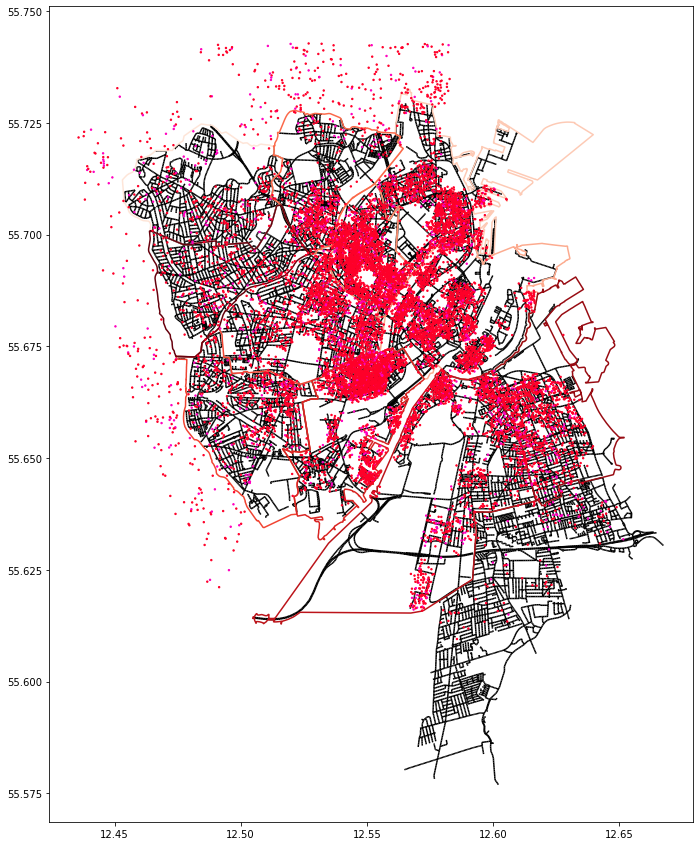

In [ ]:
fig, ax = plt.subplots(figsize=(15,15)) #Has to be treated as a subplot. See geopandas documentation
ax.set_aspect('equal')

theHoods.boundary.plot(ax=ax,zorder=1,figsize=(15,15),cmap='Reds')
map_data.plot(ax=ax,column="Mixed_BC",zorder=0,cmap="gray")
plt.scatter(data.longitude,data.latitude, s=2,c=colors,cmap="gist_rainbow",zorder=10)

plt.show();

10


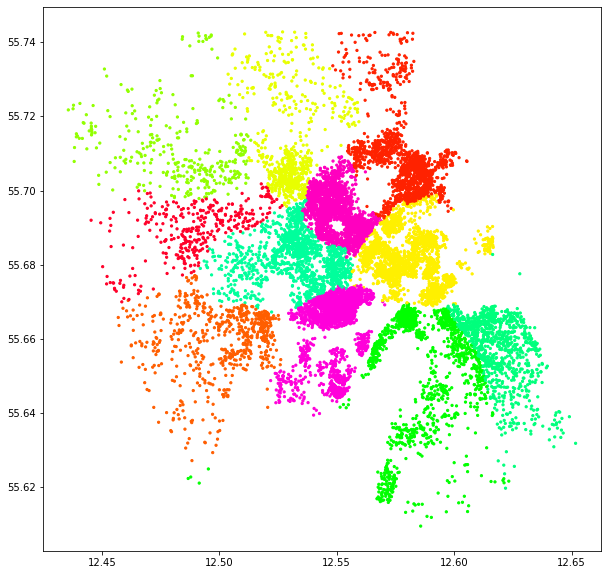

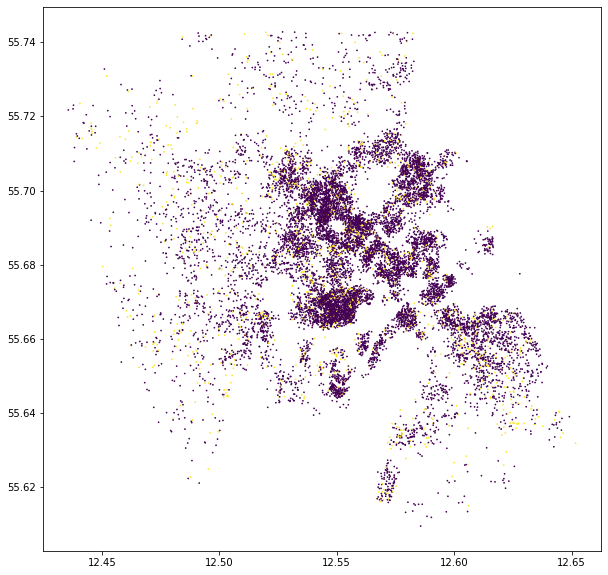

<Figure size 1080x1080 with 0 Axes>

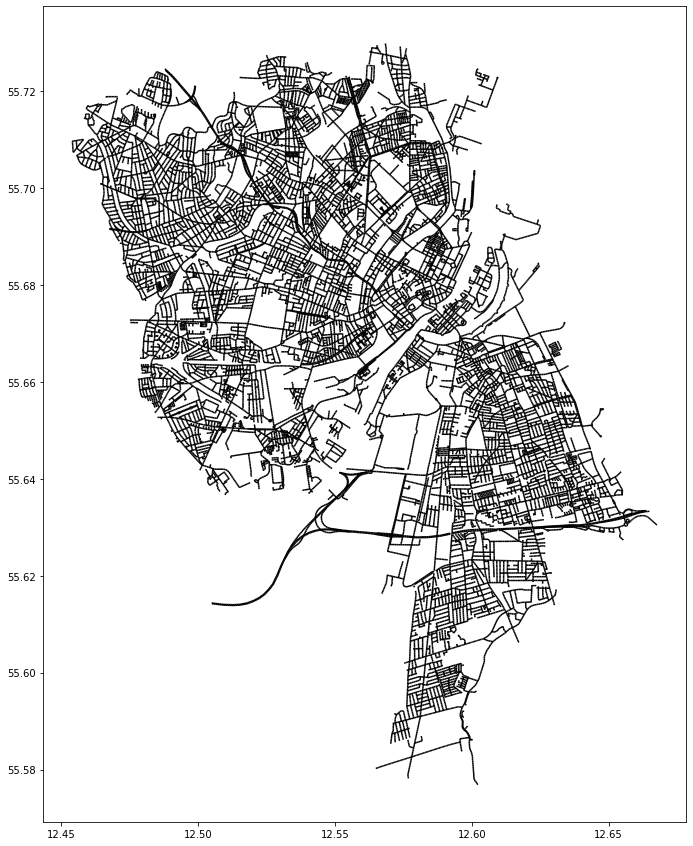

<Figure size 1080x1080 with 0 Axes>

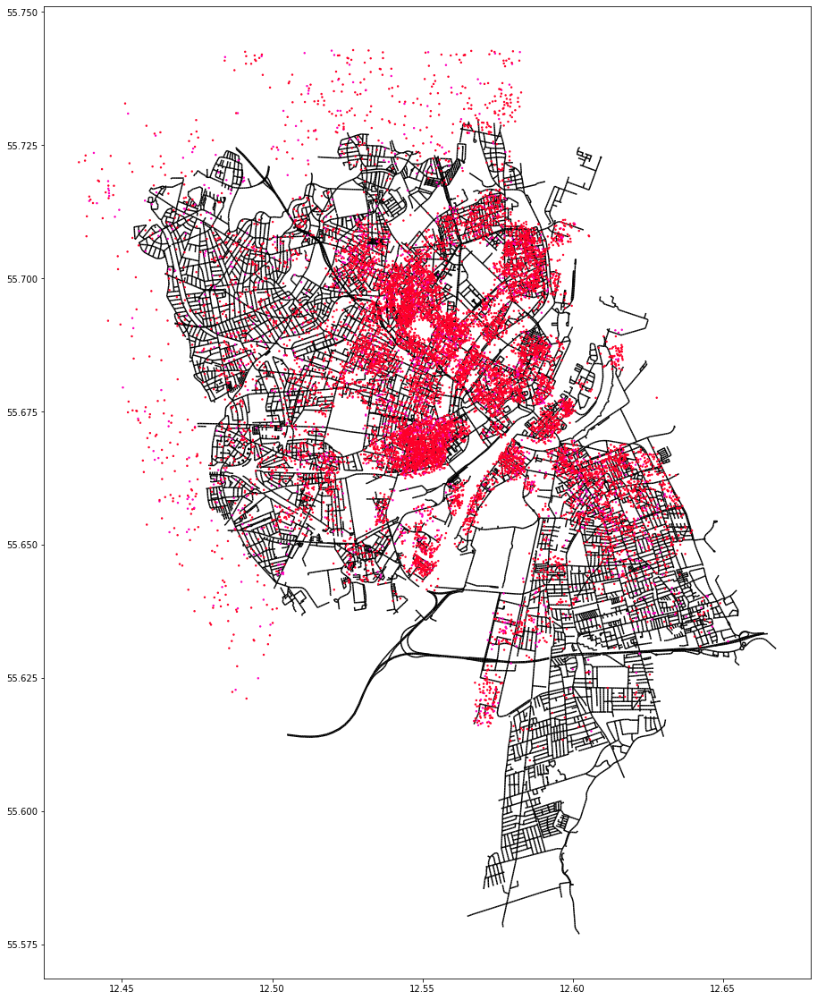

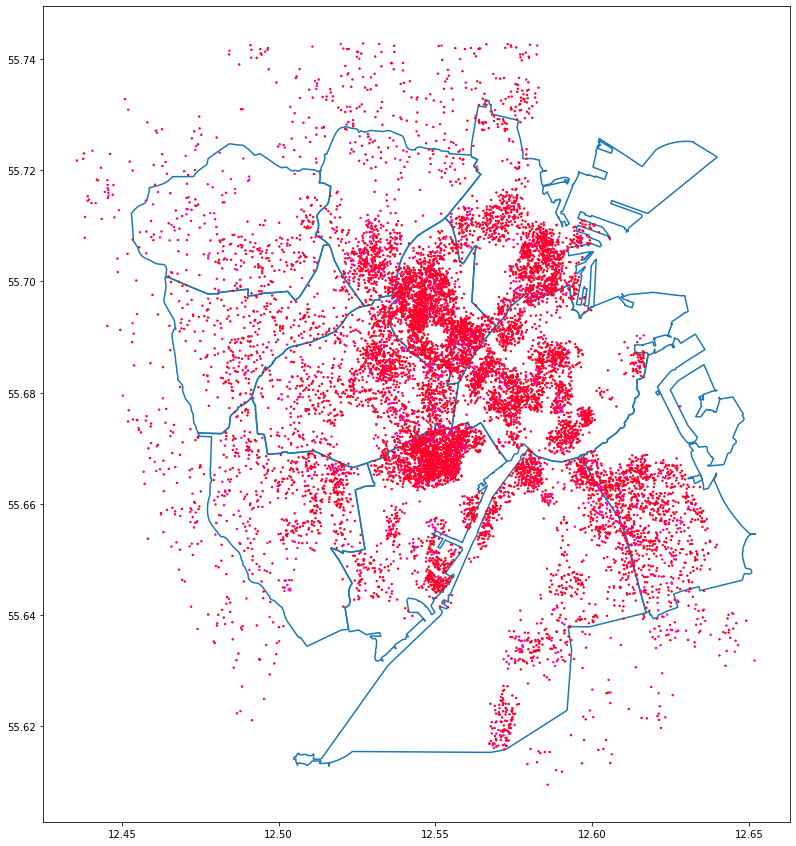

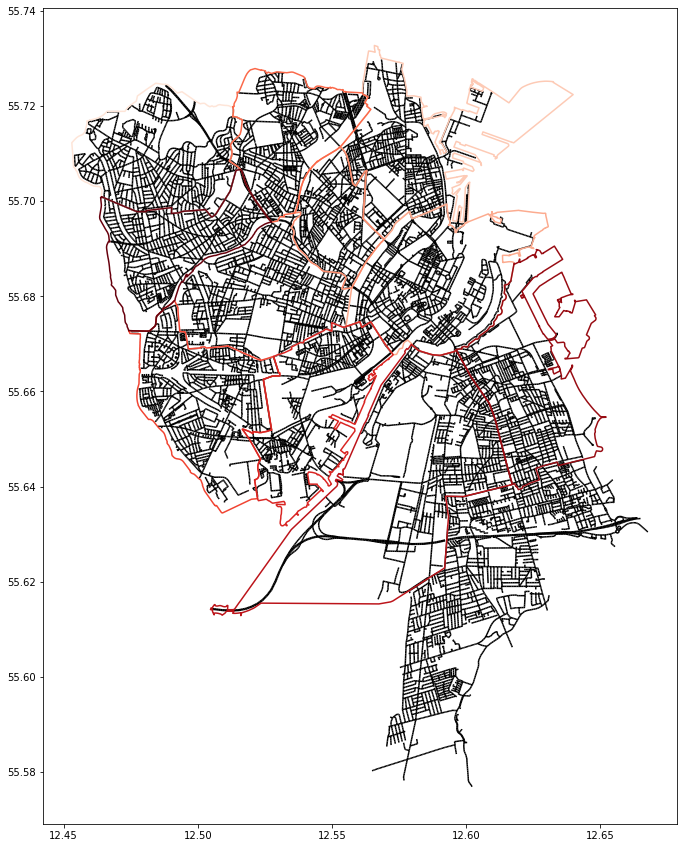

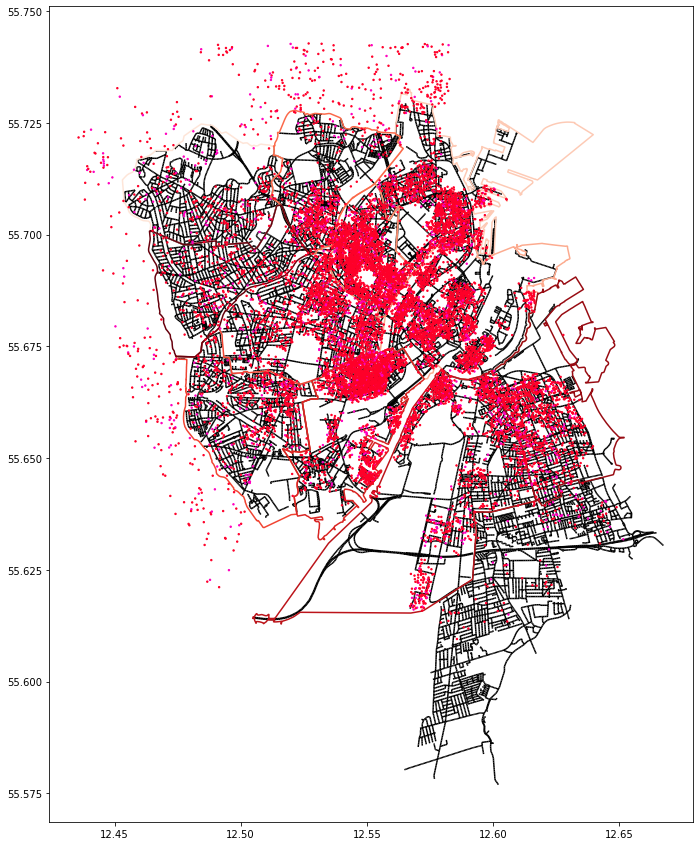

In [ ]:
#Find number of neighboorhoods in list
num_neighbourhoods=len(set(data.neighbourhood))-1 # Why -1?
print(num_neighbourhoods)

colors = [float(hash(s) % 256) / 256 for s in data.neighbourhood]      

plt.figure(figsize=(10,10))
plt.scatter(data.longitude,data.latitude, s=5,c=colors,cmap="gist_rainbow",label=data.neighbourhood)
plt.show()


colors = [float(hash(s) % 4) / 4  for s in data.room_type]      

plt.figure(figsize=(10,10))
plt.scatter(data.longitude,data.latitude, s=0.5,c=colors)
plt.show()

import geopandas as gpd
import urllib

url = "https://kkkortdata.spatialsuite.dk/airview/CAV_25May2021.geojson"
remote_data = urllib.request.urlopen(url)
map_data = gpd.read_file(remote_data)
map_data.head()

map_data.Mixed_BC=0
plt.figure(figsize=(15,15))
map_data.plot(column="Mixed_BC", cmap="gray",figsize=(15,15))
plt.show()

plt.figure(figsize=(15,15))

# set aspect to equal. This is done automatically
# when using *geopandas* plot on it's own, but not when
# working with pyplot directly.

map_data.plot(column="Mixed_BC",zorder=0,cmap="gray",figsize=(20,20))
plt.scatter(data.longitude,data.latitude, s=2,c=colors,cmap="gist_rainbow",zorder=10)

plt.show();

theHoods=gpd.read_file('neighbourhoods.geojson')
theHoods.boundary.plot(figsize=(15,15))
plt.scatter(data.longitude,data.latitude, s=2,c=colors,cmap="gist_rainbow",zorder=10)



fig, ax = plt.subplots(figsize=(15,15))
ax.set_aspect('equal')

theHoods.boundary.plot(ax=ax,zorder=1,figsize=(15,15),cmap='Reds')
map_data.plot(ax=ax,column="Mixed_BC",zorder=0,cmap="gray")

plt.show();

fig, ax = plt.subplots(figsize=(15,15)) #Has to be treated as a subplot. See geopandas documentation
ax.set_aspect('equal')

theHoods.boundary.plot(ax=ax,zorder=1,figsize=(15,15),cmap='Reds')
map_data.plot(ax=ax,column="Mixed_BC",zorder=0,cmap="gray")
plt.scatter(data.longitude,data.latitude, s=2,c=colors,cmap="gist_rainbow",zorder=10)

plt.show();

# 1.4

# 2. Prediction challenge

The second part of the notebook is about predicting whether the price of a rental is low or high, for binary classification, and whether the price of a rental is medium, low, or high, for multi class classification.

# 2.1 Binary classification

We want to predict weather the price is low so we start by defining what is a low price
We decide that a low price is a price that is lower than the median price of housing

In [ ]:
#define a low price threshold
#we will use the median price as the threshold for low price
low_price_threshold = data['price'].median()
#this means low price is lower than the median price

We want to see how many listings are more expensive and how many listings are less expensive than the low price threshold

In [ ]:
#check how many listings are below the threshold
low_price = data[data['price'] < low_price_threshold]
print('There are {} listings below the threshold'.format(len(low_price)))
#check how many listings are above the threshold
high_price = data[data['price'] > low_price_threshold]
print('There are {} listings above the threshold'.format(len(high_price)))

There are 4479 listings below the threshold
There are 4482 listings above the threshold


We see that the dataset is pretty evenly split. 
Now we want to predict weather the price will be low or high

In [ ]:
#prepare the dataset for classification
#we will use the price as the target variable

#Start by creating a new column called 'low_price', assign 1 to the low price and 0 to the high price
data['low_price'] = np.where(data['price'] < low_price_threshold, 1, 0)

/var/folders/_s/wxt2wlzx00qdfwbsx6fdl1200000gn/T/ipykernel_7174/1731640589.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['low_price'] = np.where(data['price'] < low_price_threshold, 1, 0)


Now we can create the linear regression model

In [ ]:
from sklearn.linear_model import LogisticRegression
LogReg = LogisticRegression(max_iter=100000)

Now we have a empty model.
Start by creating a test set with (2/3) of the data and training set with the remaining (1/3)

In [ ]:
#create the training and testing sets
#we will use 2/3 of the data for training and 1/3 for testing
split = int(len(data)*2/3)
train = data[:split]
test = data[split:]

Now we want to make dummy variables for the group variables, that allow us to have a single regression equation on multiple groups

In [ ]:
data.columns

Index(['neighbourhood', 'latitude', 'longitude', 'room_type', 'price',
       'minimum_nights', 'number_of_reviews', 'last_review',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365', 'number_of_reviews_ltm', 'low_price'],
      dtype='object')

In [ ]:
#make dummy variables for neighbourhood and room type
train = pd.get_dummies(train, columns=['neighbourhood', 'room_type'])
test = pd.get_dummies(test, columns=['neighbourhood', 'room_type'])


Now we want to pick the x and y for the sets.
Y is the stress variable in this case and x are all columns we think will help the prediction.
Start by taking a look at the other columns

In [ ]:
train.columns

Index(['latitude', 'longitude', 'price', 'minimum_nights', 'number_of_reviews',
       'last_review', 'reviews_per_month', 'calculated_host_listings_count',
       'availability_365', 'number_of_reviews_ltm', 'low_price',
       'neighbourhood_Amager Vest', 'neighbourhood_Amager st',
       'neighbourhood_Bispebjerg', 'neighbourhood_Brnshj-Husum',
       'neighbourhood_Frederiksberg', 'neighbourhood_Indre By',
       'neighbourhood_Nrrebro', 'neighbourhood_Valby', 'neighbourhood_Vanlse',
       'neighbourhood_Vesterbro-Kongens Enghave', 'neighbourhood_sterbro',
       'room_type_Entire home/apt', 'room_type_Hotel room',
       'room_type_Private room', 'room_type_Shared room'],
      dtype='object')

Now we want to see what kind of data is in each column

In [ ]:
test.head().T

,10246,10247,10250,10251,10252
latitude,55.65838,55.67646,55.69146,55.69247,55.66666
longitude,12.56113,12.576235,12.56275,12.55947,12.53223
price,1350,1357,850,950,1500
minimum_nights,5,5,2,5,2
number_of_reviews,2,4,3,3,4
last_review,2022-08-23 00:00:00,2022-08-14 00:00:00,2022-06-06 00:00:00,2022-08-14 00:00:00,2022-07-20 00:00:00
reviews_per_month,0.37,1.82,0.68,0.8,0.78
calculated_host_listings_count,1,1,1,1,1
availability_365,266,1,8,12,161
number_of_reviews_ltm,2,4,3,3,4


Now we make the x train and test sets with useful predictors.
Y train and test set with our target variable.

In [ ]:
#create a list of features we intend to use
base_list = ['minimum_nights', 'reviews_per_month', 'calculated_host_listings_count',
        'neighbourhood_Amager Vest', 'neighbourhood_Amager st',
       'neighbourhood_Bispebjerg', 'neighbourhood_Brnshj-Husum',
       'neighbourhood_Frederiksberg', 'neighbourhood_Indre By',
       'neighbourhood_Nrrebro', 'neighbourhood_Valby', 'neighbourhood_Vanlse',
       'neighbourhood_Vesterbro-Kongens Enghave', 'neighbourhood_sterbro',
       'room_type_Entire home/apt', 'room_type_Hotel room',
       'room_type_Private room']

x_train = train[base_list]
x_test = test[base_list]

y_train = train['low_price']
y_test = test['low_price']

Check what data is in our train variables 

In [ ]:
x_train[:5].T

,1,2,3,5,6
minimum_nights,4.00,3.00,7.00,3.00,100.00
reviews_per_month,0.55,2.06,0.16,0.54,0.05
calculated_host_listings_count,1.00,3.00,1.00,2.00,1.00
neighbourhood_Amager Vest,0.00,0.00,0.00,0.00,0.00
neighbourhood_Amager st,0.00,0.00,0.00,0.00,0.00
neighbourhood_Bispebjerg,0.00,0.00,0.00,0.00,0.00
neighbourhood_Brnshj-Husum,0.00,0.00,0.00,0.00,0.00
neighbourhood_Frederiksberg,0.00,0.00,0.00,0.00,0.00
neighbourhood_Indre By,1.00,1.00,0.00,0.00,0.00
neighbourhood_Nrrebro,0.00,0.00,0.00,0.00,0.00


Now it is time to use logistic regression to train the model

In [ ]:
#use logistic regression to train the model
LogReg.fit(x_train, y_train)

LogisticRegression(max_iter=100000)

Now we want to see how our model did.
Start by looking at the accuracy

In [ ]:
print(LogReg.score(x_test, y_test))
print(LogReg.score(x_train, y_train))

0.6464882943143813
0.6663321625689914


Since the training score is higher than the testing score, we can conclude that the model is overfitting. Next we want to take a look at the confusion matrix.

In [ ]:
#make the confusion matrix
from sklearn.metrics import confusion_matrix
y_pred = LogReg.predict(x_test)
cm = confusion_matrix(y_test, y_pred)
print(cm)

[[ 867  581]
 [ 476 1066]]


Now this matrix is not very clear, lets make a more graphical version

/Users/smaristeinn/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


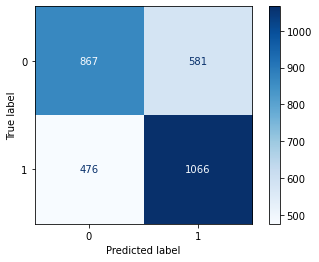

In [ ]:
#use sklearn to make the confusion matrix
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(LogReg, x_test, y_test, cmap=plt.cm.Blues)

Now lets look at the F1 score

In [ ]:
#calculate the f1 score
from sklearn.metrics import f1_score
f1_score(y_test, y_pred)

0.6685481342113515

The F1 score is 0.67, wich means our model is doing pretty good.
Lets look at the classification report.

In [ ]:
#see multi class classification report
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.65      0.60      0.62      1448
           1       0.65      0.69      0.67      1542

    accuracy                           0.65      2990
   macro avg       0.65      0.65      0.64      2990
weighted avg       0.65      0.65      0.65      2990



# 2.2 Multi class classification

The second part of the prediction challenge is about predicting whether the price of a rental is medium, low, or high, through multi class classification methods. The prediction will be made, via a decision tree, and random forest classifiers, whose performance will later be evaluated.

We will start by importing sklearn packages that will be used.

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix
from sklearn.model_selection import cross_validate
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV, cross_val_score

For the multi sclass classification the dataset will be splited in three parts: low price (<0.33 quantile), medium price (<0.66 quantile), and high price (>0.66 quantile). Also, we will check how many observations does each part have, and are they of the similar length.

In [ ]:
#define a low, medium, and high price threshold based on quantiles
q1=data['price'].quantile(0.33)  #define 33% quantile
q2=data['price'].quantile(0.66)  #define 66% quantile
data['price_class']=np.where(data['price']<=q1, 'low', (np.where(data['price']<=q2, 'medium', 'high')))
data['price_class'].value_counts()   #count observations in each part

medium    2634
low       2617
high      2600
Name: price_class, dtype: int64

Dataset is splited in a way that 70% is used as a training set, and remaining 30% as a testing set.

In [ ]:
#create the training and testing sets
split = int(len(data)*2/3)  #split data into 2/3 and 1/3 of the total data
train = data[:split]       #assign 2/3 to training
test = data[split:]        #assign 1/3 to testing

Now we can convert the two selected variables into dummy variables for the further steps, and display the newly created columns.

In [ ]:
train=pd.get_dummies(train, columns=['neighbourhood','room_type'])
test=pd.get_dummies(test, columns=['neighbourhood','room_type'])

In [ ]:
train.columns

Index(['latitude', 'longitude', 'price', 'minimum_nights', 'number_of_reviews',
       'last_review', 'reviews_per_month', 'calculated_host_listings_count',
       'availability_365', 'number_of_reviews_ltm', 'low_price', 'price_class',
       'neighbourhood_Amager Vest', 'neighbourhood_Amager st',
       'neighbourhood_Bispebjerg', 'neighbourhood_Brnshj-Husum',
       'neighbourhood_Frederiksberg', 'neighbourhood_Indre By',
       'neighbourhood_Nrrebro', 'neighbourhood_Valby', 'neighbourhood_Vanlse',
       'neighbourhood_Vesterbro-Kongens Enghave', 'neighbourhood_sterbro',
       'room_type_Entire home/apt', 'room_type_Hotel room',
       'room_type_Private room', 'room_type_Shared room'],
      dtype='object')

Features are selected to be all the dummy variables, review values, minimum nights, and availability, which are then put into training and testing set.

In [ ]:
#trainset
x_train = train[['latitude', 'longitude', 'minimum_nights', 'number_of_reviews',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365', 'number_of_reviews_ltm',
       'neighbourhood_Amager Vest', 'neighbourhood_Amager st',
       'neighbourhood_Bispebjerg', 'neighbourhood_Brnshj-Husum',
       'neighbourhood_Frederiksberg', 'neighbourhood_Indre By',
       'neighbourhood_Nrrebro', 'neighbourhood_Valby', 'neighbourhood_Vanlse',
       'neighbourhood_Vesterbro-Kongens Enghave', 'neighbourhood_sterbro',
       'room_type_Entire home/apt', 'room_type_Hotel room',
       'room_type_Private room', 'room_type_Shared room']]
#testset
x_test = test[['latitude', 'longitude', 'minimum_nights', 'number_of_reviews',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365', 'number_of_reviews_ltm',
       'neighbourhood_Amager Vest', 'neighbourhood_Amager st',
       'neighbourhood_Bispebjerg', 'neighbourhood_Brnshj-Husum',
       'neighbourhood_Frederiksberg', 'neighbourhood_Indre By',
       'neighbourhood_Nrrebro', 'neighbourhood_Valby', 'neighbourhood_Vanlse',
       'neighbourhood_Vesterbro-Kongens Enghave', 'neighbourhood_sterbro',
       'room_type_Entire home/apt', 'room_type_Hotel room',
       'room_type_Private room', 'room_type_Shared room']]
 
#target variable-->low, mid, high price
y_train = train['price_class']
y_test=test['price_class']

Decision tree classifier is simple to interpret, and understand. On top of that, requires little data preparation without data normalization, but includes creating dummy variables, as seen above.

Scikit-learn provides an object that, given data, computes the score during the fit of an estimator on a parameter grid and chooses the parameters to maximize the cross-validation score. This object takes an estimator during the construction and exposes an estimator API. In other words, we are going to iterate through all the combinations of parameter values from the grid ('param_grid'), and identify the combination of parameter values with the highest score.

Reference: (https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html), (https://scikit-learn.org/stable/tutorial/statistical_inference/model_selection.html)

In [ ]:
#create parameters grid, in this case we will select 6 values per parameter
param_grid = {
              "max_depth": [1, 3, 5, 10, 15, 30],   #max depth of the tree
              "min_samples_split": [2, 5, 10, 20, 30, 40],    #min number of samples required to split an internal node
              "min_samples_leaf": [1, 10, 20, 40, 60, 80],    #min number of samples required to be at a leaf node
              "min_weight_fraction_leaf": [0, 0.1, 0.2, 0.3, 0.4, 0.5]}   #min weighted fraction of the sum total of weights at leaf node
#create grid-search object with default 5-fold cross-validation(cv)
grid = GridSearchCV(estimator=clt, param_grid=param_grid, cv=5)  
grid_result = grid.fit(x_train, y_train)  #fit the model

NameError: name 'clt' is not defined

In [ ]:
#mean cv score of the best estimator, and parameter setting that gave the best results  
print("Best score is: %f with %s" % (grid_result.best_score_, grid_result.best_params_))

Best score is: 0.512414 with {'max_depth': 5, 'min_samples_leaf': 10, 'min_samples_split': 30, 'min_weight_fraction_leaf': 0}


Once we have optimized the parameter values, we can manualy input the recommended parameter values into our model and create a classifier object.

In [ ]:
clt = DecisionTreeClassifier(max_depth=5, min_samples_leaf= 10, min_samples_split = 30, min_weight_fraction_leaf=0)  #create decision tree classifier object
clt.fit(x_train,y_train) 

DecisionTreeClassifier(max_depth=5, min_samples_leaf=10, min_samples_split=30,
                       min_weight_fraction_leaf=0)

Now that our model is trained, we can obtain the predictions of the model using the test set (x_test).

In [ ]:
y_pred_tree = clt.predict(x_test)

Quality of predictions can now be evaluated through f1-score, accuracy, and confusion matrix.

In [ ]:
print("Accuracy is %f" % accuracy_score(y_test,y_pred_tree))
print("F1-score is %f" % f1_score(y_test,y_pred_tree,average='weighted'))
print("Confusion matrix:")
print(confusion_matrix(y_test,y_pred_tree))

Accuracy is 0.492931
F1-score is 0.488405
Confusion matrix:
[[294  37 481]
 [ 42 344 491]
 [155 121 652]]


It is visible that f1-score does not have the same value, as previously promised by optimized parameters. It is because optimization algorithms rely on a large number of iterations, to find the best combination of parameter values, and in this case, it might be the tree depth to find good parameters. However, increasing the tree depth will result in a large computation time, so we can label it as a fair performance. A nicer visualization of the confusion matrix can be achieved using its plot command (from sklearn).

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


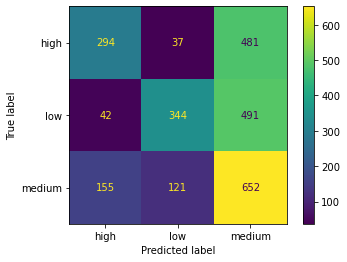

In [ ]:
plot_confusion_matrix(clt, x_test, y_test)  
plt.show()

In [ ]:
print('high:',294/(37+294+481))
print('low:',344/(42+344+491))
print('medium:',652/(155+121+655))

high: 0.3620689655172414
low: 0.3922462941847206
medium: 0.7003222341568206


The metrics from the consfusion matrix suggest that the decision tree classifier is not doing the best job, especially when predicting the high and low price class, where we have 36% and 39% observations predicted correctly. However, the medium class is doing a good job by predicting 70% of the observations correctly.

--------------------------------------------------------------------------------------------------------------------------------

Decision tree classifier often suffer from the overfitting, due its growth with lack of control, which then results in poor f1-score. The new classifier, the random forest classifier, will now be implemented. Its final output is based on majority ranking, which will reduce the overfitting. However, it is computationally more expensive, so the less parameter values will be passed when creating grid.

In [ ]:
#create parameters grid, in this case we will select 3,4 values per parameter
param_grid = {
              "max_depth": [1, 3, 5, 10],    #max depth of the tree
              "random_state": [250, 500, 750, 1000],    #ensure that results that can be reproduced
              "min_samples_split": [2, 5, 10, 20],     #min number of samples required to split an internal node
              "min_samples_leaf": [1, 10, 20],         #min number of samples required to be at a leaf node
              "min_weight_fraction_leaf": [0, 0.1, 0.2]}   #min weighted fraction of the sum total of weights at leaf node
#create grid-search object with default 5-fold cross-validation(cv)
grid = GridSearchCV(estimator=cltf, param_grid=param_grid, cv=5)
grid_result = grid.fit(x_train, y_train)    #fit the model

In [ ]:
# summarize results
print("Best score is: %f with %s" % (grid_result.best_score_, grid_result.best_params_))

Best score is: 0.547384 with {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 20, 'min_weight_fraction_leaf': 0, 'random_state': 500}


Once again we have optimized the parameter values, so we can manualy input the recommended parameter values into our model and create a classifier object.

In [ ]:
cltf = RandomForestClassifier(max_depth=10, random_state=1000, min_samples_split=20, min_samples_leaf=1, min_weight_fraction_leaf=0)  #create random forest classifier object
cltf.fit(x_train,y_train)    #train the model

RandomForestClassifier(max_depth=10, min_samples_split=20,
                       min_weight_fraction_leaf=0, random_state=1000)

Now that our model is trained, we can obtain the predictions of the model using the test set (x_test).

In [ ]:
y_pred_forest = cltf.predict(x_test)  #make predictions from the random forest model

Quality of predictions for the random forest model can now be evaluated through f1-score, accuracy, and confusion matrix.

In [ ]:
print("Accuracy is %f" % accuracy_score(y_test,y_pred_forest))
print("F1-score is %f" % f1_score(y_test,y_pred_forest, average='weighted'))
print("Confusion matrix:")
print(confusion_matrix(y_test,y_pred_forest))

Accuracy is 0.536492
F1-score is 0.540460
Confusion matrix:
[[410  56 346]
 [ 85 458 334]
 [228 164 536]]


This time f1-score does have the same value, as previously obtained by optimized parameters. It is because random forest does not rely on the feature importance given by only one decision tree, but many randomly choosen features instead. This randomized feature selection makes random forest much more accurate than a decision tree, and therefore, gives highest score. Once again, a nicer visualization of the confusion matrix can be achieved using its sklearn plot command.

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


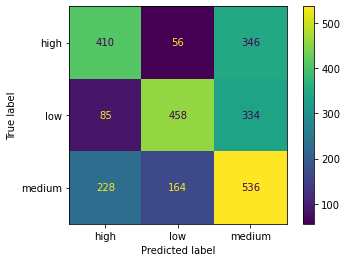

In [ ]:
plot_confusion_matrix(cltf, x_test, y_test)  
plt.show()

In [ ]:
print('high:',410/(410+56+346))
print('low:',458/(85+458+334))
print('medium:',536/(228+164+536))

high: 0.5049261083743842
low: 0.5222348916761688
medium: 0.5775862068965517


The metrics from the consfusion matrix suggest that the random forest classifier is doing better job than decision tree clasiffier, especially because when predicting all the classes, the ratio of correct predictions is more balanced, as seen above. However, correct predictions for the medium class dropped to 58%.

As previously stated, a decision tree relies on the feature importance given by a single decision tree, which results in an unbalanced ratio of correct predictions through different classes. That situation is visible when high importance was given to the medium price class in the first confusion matrix, underperforming for high and low price classes. Because of its randomized feature selection, random forest is much more accurate and does not have poor performance on any of the three classes. Therefore, random forest is definitely a better pick in this situation, when we want to take into consideration all the features.

# 3. Exploratory component

In [ ]:
#write short intro of what will be done here

# 3.2 Neural networks 

In [ ]:
from sklearn.neural_network import MLPClassifier

In [ ]:
# train/val/test split--->by default val is 10% of training

# Standardization if needed

In [ ]:
#gridsearch for MLP

In [ ]:
param_grid = {
              "max_iter": [1, 5, 10, 20, 60],
              "hidden_layer_sizes": [40, 80, 120, 160],  
              "random_state": [2, 5, 10, 20],
              "alpha": [0, 0.1, 0.01, 0.001]}

grid = GridSearchCV(estimator=mlp, param_grid=param_grid, cv=5)
grid_result = grid.fit(x_train, y_train)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_pe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (5) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (5) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (5) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (5) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_pe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilaye

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_pe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilaye

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (60) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (60) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (60) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (60) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilaye

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (5) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (5) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (5) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (5) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_pe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilaye

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_pe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilaye

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (60) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (60) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (60) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (5) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (5) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (5) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (5) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_pe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilaye

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_pe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilaye

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (60) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (60) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (60) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (60) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilaye

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (5) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (5) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (5) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (5) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_pe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilaye

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (5) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_pe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilaye

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_pe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilaye

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (60) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (60) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (60) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (60) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilaye

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (5) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (5) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (5) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (5) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_pe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilaye

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (60) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (60) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (5) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (5) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (5) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (5) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_pe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilaye

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (5) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (5) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (5) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (5) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_pe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilaye

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_pe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilaye

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (60) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (60) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (60) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (60) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilaye

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (5) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (5) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (5) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (5) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_pe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilaye

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (60) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (60) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (5) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (5) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (5) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (5) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_pe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilaye

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (5) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (5) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (5) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (5) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_pe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neural_network\_multilaye

In [ ]:
print("Best score is: %f with %s" % (grid_result.best_score_, grid_result.best_params_))

In [ ]:
# Specify the model 
# Here we specify only the hidden layer sizes (the output layer is not explicitly defined like in keras);
# Also, we can only specify a single activation function for all layers
# The activation function for the output layer is automatically determined by SK learn, for binary logistic
# regression it will use the logistic sigmoid function

# Create the classifier object
mlp=MLPClassifier(max_iter=1000,hidden_layer_sizes=(150,100,30), random_state=5, activation='relu')

In [ ]:
# Fit the neural network
mlp.fit(x_train, y_train)

MLPClassifier(hidden_layer_sizes=(150, 100, 30), max_iter=1000)

In [ ]:
#predict
y_pred = mlp.predict(x_test)

In [ ]:
#evaluate
print("Accuracy is %f" % accuracy_score(y_test,y_pred))
print("F1-score is %f" % f1_score(y_test,y_pred))
print("Confusion matrix:")
print(confusion_matrix(y_test, y_pred))